# Face Generation
This is a Udacity Deep Learning Nanodegree project. In this project, I'll use generative adversarial networks (GAN) to generate new images of faces.
### Get the Data
I will use the CelebA dataset for this project. It is on FloydHub with data ID "R5KrjnANiKVhLWAkpXhNBe"

In [ ]:
#data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('celeba', data_dir)

## Explore the Data

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. 

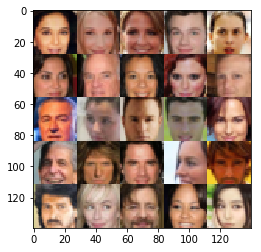

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
The values of the CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
I'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [83]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_img=tf.placeholder(tf.float32,shape=(None,image_width,image_height,image_channels),name='input_img')
    z=tf.placeholder(tf.float32,shape=(None,z_dim),name='input_z')
    lr=tf.placeholder(tf.float32,shape=(None),name='lr')
    return input_img, z, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [95]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse):
        # TODO: Implement Function
        x1 = tf.layers.conv2d(images, 128, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        relu1 = tf.maximum(0.2 * x1, x1)
        drop1 = tf.nn.dropout(relu1, 0.8)
        # 14x14x128
        
        x2 = tf.layers.conv2d(drop1, 256, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(0.2 * bn2, bn2)
        drop2 = tf.nn.dropout(relu2, 0.8)
        # 7x7x256
        
        x3 = tf.layers.conv2d(drop2, 512, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(0.2 * bn3, bn3)
        drop3 = tf.nn.dropout(relu3, 0.8)
        # 4x4x512
        
        # Flatten it
        flat = tf.reshape(drop3, (-1, 4*4*512))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
    
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [94]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse=not is_train):
        
        # First Two fully connected layer
        x1 = tf.layers.dense(z, 3*3*512) 
        
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 3, 3, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(0.2 * x1, x1)
        drop1 = tf.nn.dropout(x1, 0.8)
        # 3x3x512 now
        
        x2 = tf.layers.conv2d_transpose(drop1, 256, 3, strides=2, padding='valid', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(0.2 * x2, x2)
        drop2 = tf.nn.dropout(x2, 0.8)
        # 7x7x256 now
        
        # Output layer
        x3 = tf.layers.conv2d_transpose(drop2, 128, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(0.2 * x3, x3)
        drop3 = tf.nn.dropout(x3, 0.8)
        # 14x14x128
        
        logits = tf.layers.conv2d_transpose(drop3, out_channel_dim, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        # 28x28x3
        
        out = tf.tanh(logits)

    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [34]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.multiply(tf.ones_like(d_model_real),0.9)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.multiply(tf.ones_like(d_model_fake),0.9)))

    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [14]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [13]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [87]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model

    image_width=data_shape[1]
    image_height=data_shape[2]
    channels=data_shape[3]
    input_real, input_z, lr=model_inputs(image_width,image_height,channels, z_dim)
    d_loss, g_loss=model_loss(input_real, input_z, channels)
    d_opt, g_opt=model_opt(d_loss, g_loss, lr, beta1)
    
    num=0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                num+=1
                batch_images=batch_images*2
                
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr:learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr:learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr:learning_rate})
                
                if num % 10 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_real: batch_images, input_z: batch_z})
                    train_loss_g = g_loss.eval({input_real: batch_images, input_z: batch_z})

                    print("Epoch: {}/{}     ".format(epoch_i, epoch_count),
                          "Batch: {}     ".format(num),
                          "Discriminator Loss: {:.4f}     ".format(train_loss_d),
                          "Generator Loss: {:.4f}     ".format(train_loss_g))

                if num % 50 == 0:
                    show_generator_output(sess, 25, input_z, channels, data_image_mode)
        

### CelebA
Run the GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch. By the end it is generating high resolution novel faces!

Epoch: 0/1      Batch: 10      Discriminator Loss: 1.2775      Generator Loss: 1.0947     
Epoch: 0/1      Batch: 20      Discriminator Loss: 1.8154      Generator Loss: 1.5391     
Epoch: 0/1      Batch: 30      Discriminator Loss: 0.8452      Generator Loss: 2.4405     
Epoch: 0/1      Batch: 40      Discriminator Loss: 0.9819      Generator Loss: 1.4577     
Epoch: 0/1      Batch: 50      Discriminator Loss: 1.2663      Generator Loss: 1.7038     


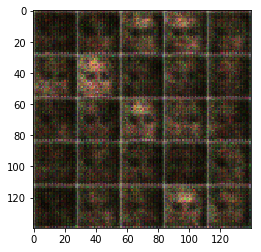

Epoch: 0/1      Batch: 60      Discriminator Loss: 1.1655      Generator Loss: 1.3565     
Epoch: 0/1      Batch: 70      Discriminator Loss: 0.9112      Generator Loss: 2.1933     
Epoch: 0/1      Batch: 80      Discriminator Loss: 1.4244      Generator Loss: 5.1373     
Epoch: 0/1      Batch: 90      Discriminator Loss: 1.0480      Generator Loss: 1.2543     
Epoch: 0/1      Batch: 100      Discriminator Loss: 0.8610      Generator Loss: 1.2888     


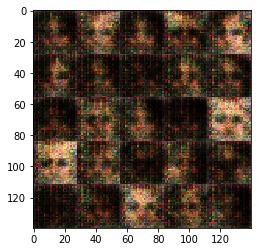

Epoch: 0/1      Batch: 110      Discriminator Loss: 0.6443      Generator Loss: 1.9013     
Epoch: 0/1      Batch: 120      Discriminator Loss: 1.1334      Generator Loss: 1.2054     
Epoch: 0/1      Batch: 130      Discriminator Loss: 1.2426      Generator Loss: 0.7150     
Epoch: 0/1      Batch: 140      Discriminator Loss: 0.6555      Generator Loss: 1.5452     
Epoch: 0/1      Batch: 150      Discriminator Loss: 0.7047      Generator Loss: 2.2347     


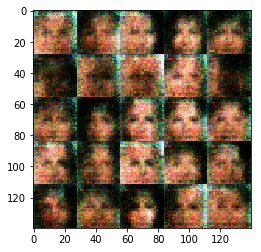

Epoch: 0/1      Batch: 160      Discriminator Loss: 1.6804      Generator Loss: 0.5529     
Epoch: 0/1      Batch: 170      Discriminator Loss: 1.0293      Generator Loss: 1.0278     
Epoch: 0/1      Batch: 180      Discriminator Loss: 0.7647      Generator Loss: 1.6848     
Epoch: 0/1      Batch: 190      Discriminator Loss: 1.4204      Generator Loss: 0.7793     
Epoch: 0/1      Batch: 200      Discriminator Loss: 1.4595      Generator Loss: 0.6687     


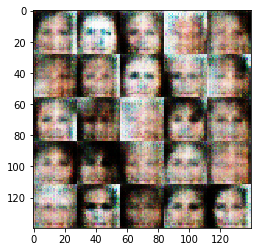

Epoch: 0/1      Batch: 210      Discriminator Loss: 1.2948      Generator Loss: 0.8655     
Epoch: 0/1      Batch: 220      Discriminator Loss: 0.7284      Generator Loss: 1.2983     
Epoch: 0/1      Batch: 230      Discriminator Loss: 1.0388      Generator Loss: 1.0835     
Epoch: 0/1      Batch: 240      Discriminator Loss: 2.2749      Generator Loss: 0.4344     
Epoch: 0/1      Batch: 250      Discriminator Loss: 0.9652      Generator Loss: 1.3898     


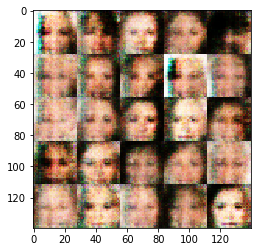

Epoch: 0/1      Batch: 260      Discriminator Loss: 1.1088      Generator Loss: 1.1315     
Epoch: 0/1      Batch: 270      Discriminator Loss: 1.1225      Generator Loss: 1.6248     
Epoch: 0/1      Batch: 280      Discriminator Loss: 1.0398      Generator Loss: 1.1171     
Epoch: 0/1      Batch: 290      Discriminator Loss: 1.3407      Generator Loss: 0.9094     
Epoch: 0/1      Batch: 300      Discriminator Loss: 1.2833      Generator Loss: 0.6488     


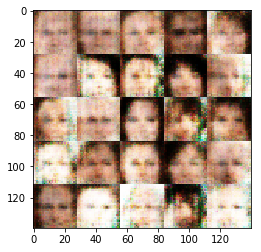

Epoch: 0/1      Batch: 310      Discriminator Loss: 1.6393      Generator Loss: 0.6376     
Epoch: 0/1      Batch: 320      Discriminator Loss: 1.2018      Generator Loss: 1.2942     
Epoch: 0/1      Batch: 330      Discriminator Loss: 1.3040      Generator Loss: 0.9700     
Epoch: 0/1      Batch: 340      Discriminator Loss: 1.2405      Generator Loss: 1.3007     
Epoch: 0/1      Batch: 350      Discriminator Loss: 1.2337      Generator Loss: 1.7224     


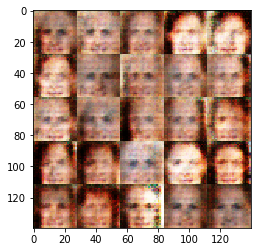

Epoch: 0/1      Batch: 360      Discriminator Loss: 1.0398      Generator Loss: 1.0362     
Epoch: 0/1      Batch: 370      Discriminator Loss: 1.6604      Generator Loss: 3.3216     
Epoch: 0/1      Batch: 380      Discriminator Loss: 1.1016      Generator Loss: 1.5257     
Epoch: 0/1      Batch: 390      Discriminator Loss: 1.2865      Generator Loss: 1.2301     
Epoch: 0/1      Batch: 400      Discriminator Loss: 1.1861      Generator Loss: 1.2264     


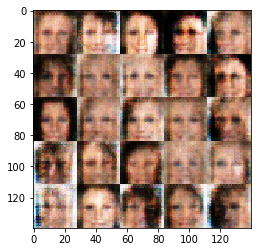

Epoch: 0/1      Batch: 410      Discriminator Loss: 1.3520      Generator Loss: 0.7942     
Epoch: 0/1      Batch: 420      Discriminator Loss: 1.3127      Generator Loss: 1.0713     
Epoch: 0/1      Batch: 430      Discriminator Loss: 1.2487      Generator Loss: 1.4150     
Epoch: 0/1      Batch: 440      Discriminator Loss: 1.5313      Generator Loss: 0.7760     
Epoch: 0/1      Batch: 450      Discriminator Loss: 1.1028      Generator Loss: 1.3397     


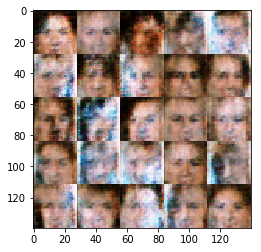

Epoch: 0/1      Batch: 460      Discriminator Loss: 1.4075      Generator Loss: 1.0057     
Epoch: 0/1      Batch: 470      Discriminator Loss: 1.2596      Generator Loss: 1.4306     
Epoch: 0/1      Batch: 480      Discriminator Loss: 1.4501      Generator Loss: 0.7984     
Epoch: 0/1      Batch: 490      Discriminator Loss: 1.5096      Generator Loss: 0.6708     
Epoch: 0/1      Batch: 500      Discriminator Loss: 1.7401      Generator Loss: 0.9379     


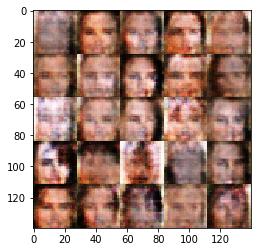

Epoch: 0/1      Batch: 510      Discriminator Loss: 1.2691      Generator Loss: 1.0697     
Epoch: 0/1      Batch: 520      Discriminator Loss: 1.1334      Generator Loss: 0.8677     
Epoch: 0/1      Batch: 530      Discriminator Loss: 1.2377      Generator Loss: 1.3005     
Epoch: 0/1      Batch: 540      Discriminator Loss: 1.2947      Generator Loss: 1.0531     
Epoch: 0/1      Batch: 550      Discriminator Loss: 1.0911      Generator Loss: 1.0113     


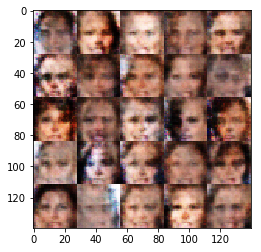

Epoch: 0/1      Batch: 560      Discriminator Loss: 1.2107      Generator Loss: 1.1630     
Epoch: 0/1      Batch: 570      Discriminator Loss: 1.7293      Generator Loss: 0.6421     
Epoch: 0/1      Batch: 580      Discriminator Loss: 1.5113      Generator Loss: 0.8486     
Epoch: 0/1      Batch: 590      Discriminator Loss: 1.1806      Generator Loss: 0.9511     
Epoch: 0/1      Batch: 600      Discriminator Loss: 1.3717      Generator Loss: 0.7705     


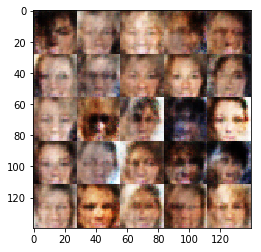

Epoch: 0/1      Batch: 610      Discriminator Loss: 1.3257      Generator Loss: 0.7268     
Epoch: 0/1      Batch: 620      Discriminator Loss: 1.8302      Generator Loss: 0.6796     
Epoch: 0/1      Batch: 630      Discriminator Loss: 1.3687      Generator Loss: 0.7883     
Epoch: 0/1      Batch: 640      Discriminator Loss: 1.3203      Generator Loss: 0.7819     
Epoch: 0/1      Batch: 650      Discriminator Loss: 1.1268      Generator Loss: 1.4438     


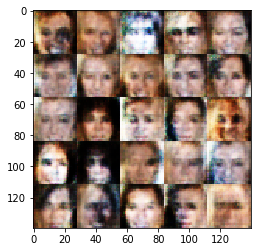

Epoch: 0/1      Batch: 660      Discriminator Loss: 1.3906      Generator Loss: 0.9885     
Epoch: 0/1      Batch: 670      Discriminator Loss: 1.1073      Generator Loss: 0.9876     
Epoch: 0/1      Batch: 680      Discriminator Loss: 1.3643      Generator Loss: 0.9613     
Epoch: 0/1      Batch: 690      Discriminator Loss: 1.2678      Generator Loss: 0.7667     
Epoch: 0/1      Batch: 700      Discriminator Loss: 1.5111      Generator Loss: 0.7701     


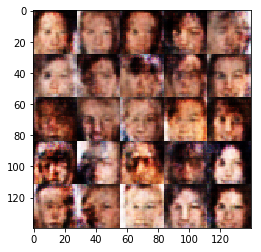

Epoch: 0/1      Batch: 710      Discriminator Loss: 1.3169      Generator Loss: 0.9174     
Epoch: 0/1      Batch: 720      Discriminator Loss: 1.3102      Generator Loss: 0.8395     
Epoch: 0/1      Batch: 730      Discriminator Loss: 1.3643      Generator Loss: 0.8642     
Epoch: 0/1      Batch: 740      Discriminator Loss: 1.6950      Generator Loss: 0.7346     
Epoch: 0/1      Batch: 750      Discriminator Loss: 1.1885      Generator Loss: 0.9788     


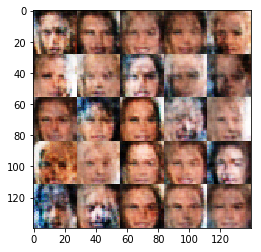

Epoch: 0/1      Batch: 760      Discriminator Loss: 1.3775      Generator Loss: 1.0012     
Epoch: 0/1      Batch: 770      Discriminator Loss: 1.4306      Generator Loss: 1.0135     
Epoch: 0/1      Batch: 780      Discriminator Loss: 1.4262      Generator Loss: 0.7639     
Epoch: 0/1      Batch: 790      Discriminator Loss: 1.1328      Generator Loss: 1.1565     
Epoch: 0/1      Batch: 800      Discriminator Loss: 1.3883      Generator Loss: 0.8020     


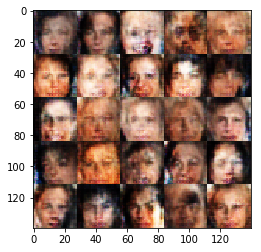

Epoch: 0/1      Batch: 810      Discriminator Loss: 1.5829      Generator Loss: 0.9401     
Epoch: 0/1      Batch: 820      Discriminator Loss: 1.4133      Generator Loss: 0.6760     
Epoch: 0/1      Batch: 830      Discriminator Loss: 1.1965      Generator Loss: 1.0027     
Epoch: 0/1      Batch: 840      Discriminator Loss: 1.0234      Generator Loss: 1.0210     
Epoch: 0/1      Batch: 850      Discriminator Loss: 1.4455      Generator Loss: 0.9371     


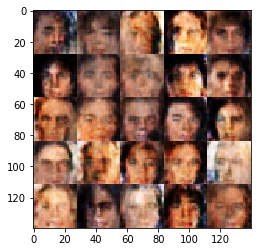

Epoch: 0/1      Batch: 860      Discriminator Loss: 1.0522      Generator Loss: 1.1794     
Epoch: 0/1      Batch: 870      Discriminator Loss: 1.3759      Generator Loss: 0.9375     
Epoch: 0/1      Batch: 880      Discriminator Loss: 1.4087      Generator Loss: 0.8464     
Epoch: 0/1      Batch: 890      Discriminator Loss: 1.1984      Generator Loss: 1.0147     
Epoch: 0/1      Batch: 900      Discriminator Loss: 1.2434      Generator Loss: 1.1004     


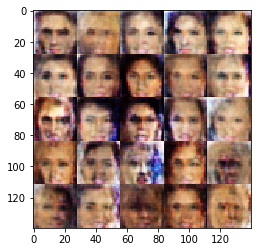

Epoch: 0/1      Batch: 910      Discriminator Loss: 1.5109      Generator Loss: 0.8975     
Epoch: 0/1      Batch: 920      Discriminator Loss: 1.2626      Generator Loss: 0.9047     
Epoch: 0/1      Batch: 930      Discriminator Loss: 1.4903      Generator Loss: 0.6720     
Epoch: 0/1      Batch: 940      Discriminator Loss: 1.2541      Generator Loss: 0.9845     
Epoch: 0/1      Batch: 950      Discriminator Loss: 1.2205      Generator Loss: 0.7884     


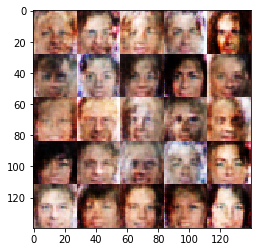

Epoch: 0/1      Batch: 960      Discriminator Loss: 1.2042      Generator Loss: 1.0737     
Epoch: 0/1      Batch: 970      Discriminator Loss: 1.4095      Generator Loss: 1.0591     
Epoch: 0/1      Batch: 980      Discriminator Loss: 1.5415      Generator Loss: 0.7105     
Epoch: 0/1      Batch: 990      Discriminator Loss: 1.4160      Generator Loss: 0.6458     
Epoch: 0/1      Batch: 1000      Discriminator Loss: 1.3785      Generator Loss: 0.7827     


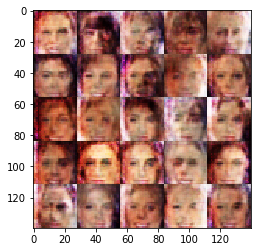

Epoch: 0/1      Batch: 1010      Discriminator Loss: 1.3005      Generator Loss: 0.8014     
Epoch: 0/1      Batch: 1020      Discriminator Loss: 1.3031      Generator Loss: 1.0693     
Epoch: 0/1      Batch: 1030      Discriminator Loss: 1.2932      Generator Loss: 0.9648     
Epoch: 0/1      Batch: 1040      Discriminator Loss: 1.1795      Generator Loss: 0.8639     
Epoch: 0/1      Batch: 1050      Discriminator Loss: 1.5846      Generator Loss: 1.1678     


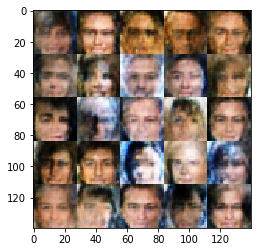

Epoch: 0/1      Batch: 1060      Discriminator Loss: 1.3226      Generator Loss: 0.7173     
Epoch: 0/1      Batch: 1070      Discriminator Loss: 1.2197      Generator Loss: 1.1104     
Epoch: 0/1      Batch: 1080      Discriminator Loss: 1.4446      Generator Loss: 1.1053     
Epoch: 0/1      Batch: 1090      Discriminator Loss: 1.1435      Generator Loss: 0.8523     
Epoch: 0/1      Batch: 1100      Discriminator Loss: 1.8201      Generator Loss: 0.6710     


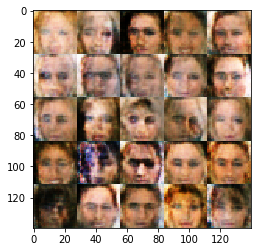

Epoch: 0/1      Batch: 1110      Discriminator Loss: 1.3180      Generator Loss: 0.7888     
Epoch: 0/1      Batch: 1120      Discriminator Loss: 1.2323      Generator Loss: 0.9591     
Epoch: 0/1      Batch: 1130      Discriminator Loss: 1.2998      Generator Loss: 0.8082     
Epoch: 0/1      Batch: 1140      Discriminator Loss: 1.3572      Generator Loss: 0.7294     
Epoch: 0/1      Batch: 1150      Discriminator Loss: 1.2129      Generator Loss: 0.9890     


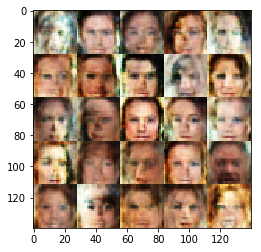

Epoch: 0/1      Batch: 1160      Discriminator Loss: 1.3604      Generator Loss: 0.8124     
Epoch: 0/1      Batch: 1170      Discriminator Loss: 1.2545      Generator Loss: 1.0378     
Epoch: 0/1      Batch: 1180      Discriminator Loss: 1.2752      Generator Loss: 0.8504     
Epoch: 0/1      Batch: 1190      Discriminator Loss: 1.2816      Generator Loss: 0.8054     
Epoch: 0/1      Batch: 1200      Discriminator Loss: 1.0995      Generator Loss: 1.0522     


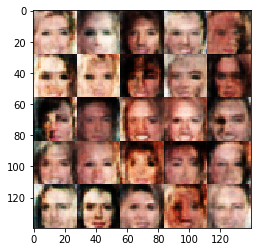

Epoch: 0/1      Batch: 1210      Discriminator Loss: 1.3989      Generator Loss: 0.8439     
Epoch: 0/1      Batch: 1220      Discriminator Loss: 1.3432      Generator Loss: 0.9501     
Epoch: 0/1      Batch: 1230      Discriminator Loss: 1.3015      Generator Loss: 0.8886     
Epoch: 0/1      Batch: 1240      Discriminator Loss: 1.5787      Generator Loss: 0.7709     
Epoch: 0/1      Batch: 1250      Discriminator Loss: 1.3510      Generator Loss: 0.7828     


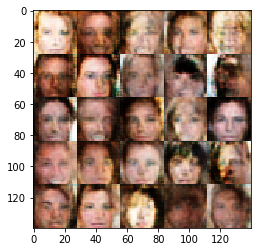

Epoch: 0/1      Batch: 1260      Discriminator Loss: 1.3356      Generator Loss: 0.7548     
Epoch: 0/1      Batch: 1270      Discriminator Loss: 1.2672      Generator Loss: 0.7627     
Epoch: 0/1      Batch: 1280      Discriminator Loss: 1.4658      Generator Loss: 0.8632     
Epoch: 0/1      Batch: 1290      Discriminator Loss: 1.2599      Generator Loss: 0.9293     
Epoch: 0/1      Batch: 1300      Discriminator Loss: 1.1378      Generator Loss: 1.0573     


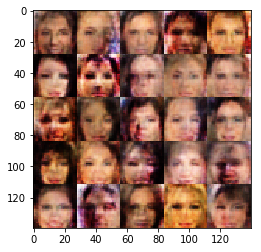

Epoch: 0/1      Batch: 1310      Discriminator Loss: 1.1362      Generator Loss: 1.0436     
Epoch: 0/1      Batch: 1320      Discriminator Loss: 1.2119      Generator Loss: 0.9390     
Epoch: 0/1      Batch: 1330      Discriminator Loss: 1.2663      Generator Loss: 0.8866     
Epoch: 0/1      Batch: 1340      Discriminator Loss: 1.4469      Generator Loss: 0.7683     
Epoch: 0/1      Batch: 1350      Discriminator Loss: 1.1261      Generator Loss: 1.1083     


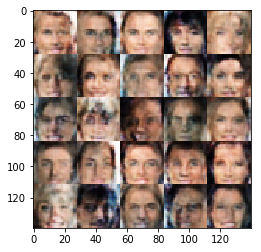

Epoch: 0/1      Batch: 1360      Discriminator Loss: 1.1703      Generator Loss: 0.8085     
Epoch: 0/1      Batch: 1370      Discriminator Loss: 1.1382      Generator Loss: 1.1174     
Epoch: 0/1      Batch: 1380      Discriminator Loss: 1.3783      Generator Loss: 0.9124     
Epoch: 0/1      Batch: 1390      Discriminator Loss: 1.3518      Generator Loss: 0.8667     
Epoch: 0/1      Batch: 1400      Discriminator Loss: 1.4340      Generator Loss: 0.6939     


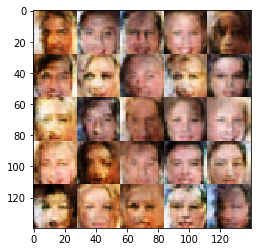

Epoch: 0/1      Batch: 1410      Discriminator Loss: 1.3972      Generator Loss: 0.8526     
Epoch: 0/1      Batch: 1420      Discriminator Loss: 1.3449      Generator Loss: 1.0381     
Epoch: 0/1      Batch: 1430      Discriminator Loss: 1.2159      Generator Loss: 0.9605     
Epoch: 0/1      Batch: 1440      Discriminator Loss: 1.1905      Generator Loss: 0.8692     
Epoch: 0/1      Batch: 1450      Discriminator Loss: 1.1098      Generator Loss: 0.9288     


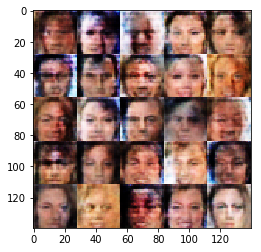

Epoch: 0/1      Batch: 1460      Discriminator Loss: 1.4828      Generator Loss: 0.9102     
Epoch: 0/1      Batch: 1470      Discriminator Loss: 1.3547      Generator Loss: 0.7030     
Epoch: 0/1      Batch: 1480      Discriminator Loss: 1.1965      Generator Loss: 1.1073     
Epoch: 0/1      Batch: 1490      Discriminator Loss: 1.3825      Generator Loss: 0.8033     
Epoch: 0/1      Batch: 1500      Discriminator Loss: 1.3468      Generator Loss: 0.6409     


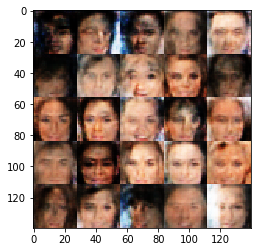

Epoch: 0/1      Batch: 1510      Discriminator Loss: 1.1815      Generator Loss: 0.9076     
Epoch: 0/1      Batch: 1520      Discriminator Loss: 1.2833      Generator Loss: 1.0309     
Epoch: 0/1      Batch: 1530      Discriminator Loss: 1.1863      Generator Loss: 0.6999     
Epoch: 0/1      Batch: 1540      Discriminator Loss: 1.2627      Generator Loss: 0.7439     
Epoch: 0/1      Batch: 1550      Discriminator Loss: 1.2749      Generator Loss: 1.0035     


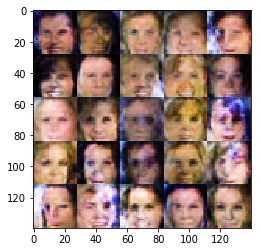

Epoch: 0/1      Batch: 1560      Discriminator Loss: 1.1957      Generator Loss: 0.8876     
Epoch: 0/1      Batch: 1570      Discriminator Loss: 1.3442      Generator Loss: 0.7810     
Epoch: 0/1      Batch: 1580      Discriminator Loss: 1.2358      Generator Loss: 0.9293     
Epoch: 0/1      Batch: 1590      Discriminator Loss: 1.3191      Generator Loss: 0.9321     
Epoch: 0/1      Batch: 1600      Discriminator Loss: 1.3390      Generator Loss: 0.8249     


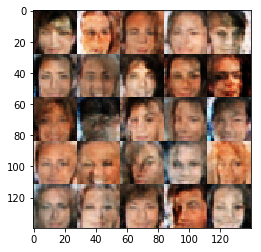

Epoch: 0/1      Batch: 1610      Discriminator Loss: 1.1519      Generator Loss: 1.0517     
Epoch: 0/1      Batch: 1620      Discriminator Loss: 1.4322      Generator Loss: 0.7667     
Epoch: 0/1      Batch: 1630      Discriminator Loss: 1.2312      Generator Loss: 0.7520     
Epoch: 0/1      Batch: 1640      Discriminator Loss: 1.3804      Generator Loss: 0.6953     
Epoch: 0/1      Batch: 1650      Discriminator Loss: 1.4841      Generator Loss: 0.7960     


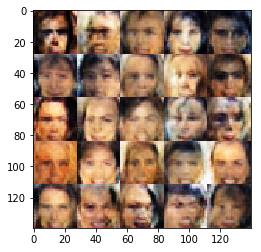

Epoch: 0/1      Batch: 1660      Discriminator Loss: 1.4122      Generator Loss: 1.0876     
Epoch: 0/1      Batch: 1670      Discriminator Loss: 1.3244      Generator Loss: 0.7584     
Epoch: 0/1      Batch: 1680      Discriminator Loss: 1.3261      Generator Loss: 0.7457     
Epoch: 0/1      Batch: 1690      Discriminator Loss: 1.1783      Generator Loss: 0.8846     
Epoch: 0/1      Batch: 1700      Discriminator Loss: 1.3010      Generator Loss: 0.9642     


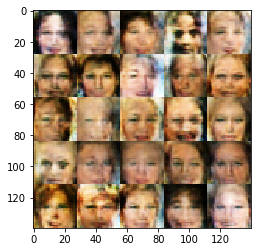

Epoch: 0/1      Batch: 1710      Discriminator Loss: 1.3787      Generator Loss: 0.7735     
Epoch: 0/1      Batch: 1720      Discriminator Loss: 1.1417      Generator Loss: 0.9607     
Epoch: 0/1      Batch: 1730      Discriminator Loss: 1.0597      Generator Loss: 1.0326     
Epoch: 0/1      Batch: 1740      Discriminator Loss: 1.4640      Generator Loss: 1.0287     
Epoch: 0/1      Batch: 1750      Discriminator Loss: 1.3126      Generator Loss: 0.9754     


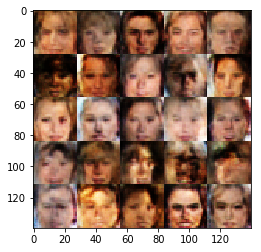

Epoch: 0/1      Batch: 1760      Discriminator Loss: 1.3599      Generator Loss: 0.9428     
Epoch: 0/1      Batch: 1770      Discriminator Loss: 1.2260      Generator Loss: 0.9406     
Epoch: 0/1      Batch: 1780      Discriminator Loss: 1.3325      Generator Loss: 0.7858     
Epoch: 0/1      Batch: 1790      Discriminator Loss: 1.2413      Generator Loss: 1.0313     
Epoch: 0/1      Batch: 1800      Discriminator Loss: 1.3500      Generator Loss: 0.6978     


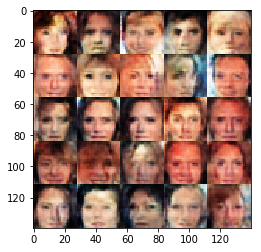

Epoch: 0/1      Batch: 1810      Discriminator Loss: 1.4025      Generator Loss: 0.9252     
Epoch: 0/1      Batch: 1820      Discriminator Loss: 1.3874      Generator Loss: 0.9268     
Epoch: 0/1      Batch: 1830      Discriminator Loss: 1.2744      Generator Loss: 0.8464     
Epoch: 0/1      Batch: 1840      Discriminator Loss: 1.2308      Generator Loss: 0.9312     
Epoch: 0/1      Batch: 1850      Discriminator Loss: 1.3532      Generator Loss: 0.8724     


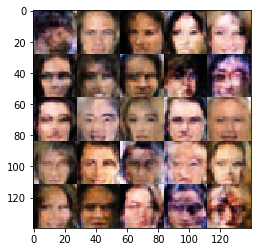

Epoch: 0/1      Batch: 1860      Discriminator Loss: 1.1277      Generator Loss: 1.0209     
Epoch: 0/1      Batch: 1870      Discriminator Loss: 1.3866      Generator Loss: 0.6512     
Epoch: 0/1      Batch: 1880      Discriminator Loss: 1.0997      Generator Loss: 0.8441     
Epoch: 0/1      Batch: 1890      Discriminator Loss: 1.1227      Generator Loss: 0.9236     
Epoch: 0/1      Batch: 1900      Discriminator Loss: 1.2872      Generator Loss: 0.8868     


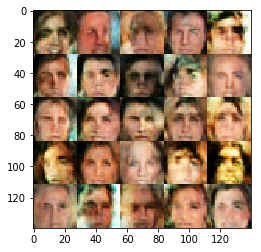

Epoch: 0/1      Batch: 1910      Discriminator Loss: 1.3226      Generator Loss: 0.8122     
Epoch: 0/1      Batch: 1920      Discriminator Loss: 1.2059      Generator Loss: 0.8860     
Epoch: 0/1      Batch: 1930      Discriminator Loss: 1.0435      Generator Loss: 0.8284     
Epoch: 0/1      Batch: 1940      Discriminator Loss: 1.4374      Generator Loss: 0.7322     
Epoch: 0/1      Batch: 1950      Discriminator Loss: 1.2517      Generator Loss: 0.7679     


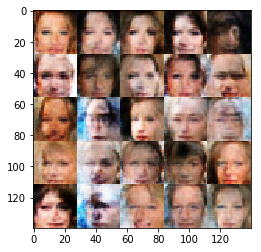

Epoch: 0/1      Batch: 1960      Discriminator Loss: 1.3412      Generator Loss: 0.9508     
Epoch: 0/1      Batch: 1970      Discriminator Loss: 1.2463      Generator Loss: 1.0487     
Epoch: 0/1      Batch: 1980      Discriminator Loss: 1.3152      Generator Loss: 0.7896     
Epoch: 0/1      Batch: 1990      Discriminator Loss: 1.3123      Generator Loss: 0.7221     
Epoch: 0/1      Batch: 2000      Discriminator Loss: 1.5484      Generator Loss: 1.2202     


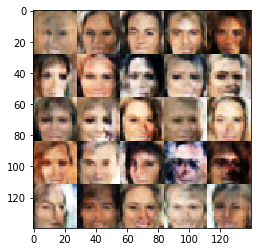

Epoch: 0/1      Batch: 2010      Discriminator Loss: 1.3420      Generator Loss: 0.9699     
Epoch: 0/1      Batch: 2020      Discriminator Loss: 1.3211      Generator Loss: 1.0045     
Epoch: 0/1      Batch: 2030      Discriminator Loss: 1.3271      Generator Loss: 0.7221     
Epoch: 0/1      Batch: 2040      Discriminator Loss: 1.1645      Generator Loss: 0.9110     
Epoch: 0/1      Batch: 2050      Discriminator Loss: 1.1579      Generator Loss: 0.8522     


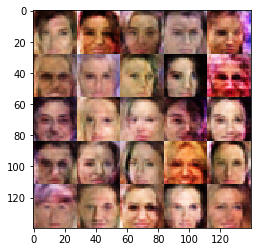

Epoch: 0/1      Batch: 2060      Discriminator Loss: 1.2627      Generator Loss: 0.7317     
Epoch: 0/1      Batch: 2070      Discriminator Loss: 1.3869      Generator Loss: 0.9416     
Epoch: 0/1      Batch: 2080      Discriminator Loss: 1.2462      Generator Loss: 0.8881     
Epoch: 0/1      Batch: 2090      Discriminator Loss: 1.0973      Generator Loss: 0.8421     
Epoch: 0/1      Batch: 2100      Discriminator Loss: 1.3045      Generator Loss: 1.0083     


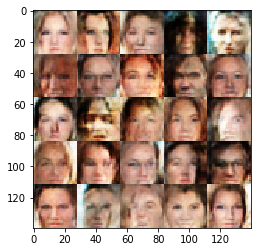

Epoch: 0/1      Batch: 2110      Discriminator Loss: 1.2106      Generator Loss: 1.0882     
Epoch: 0/1      Batch: 2120      Discriminator Loss: 1.3188      Generator Loss: 1.0200     
Epoch: 0/1      Batch: 2130      Discriminator Loss: 1.2310      Generator Loss: 1.0946     
Epoch: 0/1      Batch: 2140      Discriminator Loss: 1.1428      Generator Loss: 0.9246     
Epoch: 0/1      Batch: 2150      Discriminator Loss: 1.1833      Generator Loss: 0.9906     


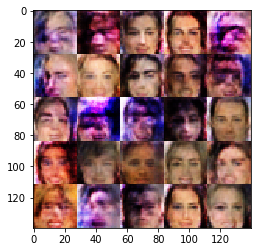

Epoch: 0/1      Batch: 2160      Discriminator Loss: 1.3208      Generator Loss: 0.8774     
Epoch: 0/1      Batch: 2170      Discriminator Loss: 1.2962      Generator Loss: 0.7655     
Epoch: 0/1      Batch: 2180      Discriminator Loss: 1.4364      Generator Loss: 0.9433     
Epoch: 0/1      Batch: 2190      Discriminator Loss: 1.3342      Generator Loss: 0.7045     
Epoch: 0/1      Batch: 2200      Discriminator Loss: 1.3744      Generator Loss: 0.9745     


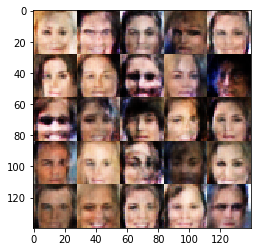

Epoch: 0/1      Batch: 2210      Discriminator Loss: 1.3421      Generator Loss: 0.9137     
Epoch: 0/1      Batch: 2220      Discriminator Loss: 1.2451      Generator Loss: 0.7382     
Epoch: 0/1      Batch: 2230      Discriminator Loss: 1.3154      Generator Loss: 0.7116     
Epoch: 0/1      Batch: 2240      Discriminator Loss: 1.1210      Generator Loss: 1.0068     
Epoch: 0/1      Batch: 2250      Discriminator Loss: 1.4139      Generator Loss: 0.7478     


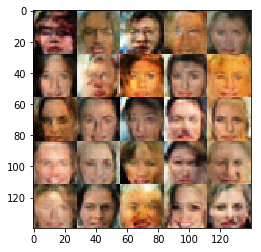

Epoch: 0/1      Batch: 2260      Discriminator Loss: 1.3294      Generator Loss: 0.7385     
Epoch: 0/1      Batch: 2270      Discriminator Loss: 1.3100      Generator Loss: 0.9492     
Epoch: 0/1      Batch: 2280      Discriminator Loss: 1.3210      Generator Loss: 0.6595     
Epoch: 0/1      Batch: 2290      Discriminator Loss: 1.2798      Generator Loss: 0.8475     
Epoch: 0/1      Batch: 2300      Discriminator Loss: 1.1140      Generator Loss: 0.7553     


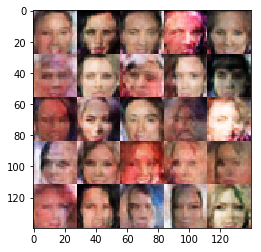

Epoch: 0/1      Batch: 2310      Discriminator Loss: 1.1345      Generator Loss: 1.1474     
Epoch: 0/1      Batch: 2320      Discriminator Loss: 1.3411      Generator Loss: 1.0214     
Epoch: 0/1      Batch: 2330      Discriminator Loss: 1.2427      Generator Loss: 0.8603     
Epoch: 0/1      Batch: 2340      Discriminator Loss: 1.3851      Generator Loss: 0.7171     
Epoch: 0/1      Batch: 2350      Discriminator Loss: 1.3717      Generator Loss: 0.8022     


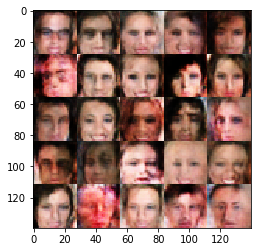

Epoch: 0/1      Batch: 2360      Discriminator Loss: 1.4606      Generator Loss: 0.6699     
Epoch: 0/1      Batch: 2370      Discriminator Loss: 1.1518      Generator Loss: 0.9038     
Epoch: 0/1      Batch: 2380      Discriminator Loss: 1.1975      Generator Loss: 0.9396     
Epoch: 0/1      Batch: 2390      Discriminator Loss: 1.0989      Generator Loss: 0.9435     
Epoch: 0/1      Batch: 2400      Discriminator Loss: 1.3602      Generator Loss: 0.7272     


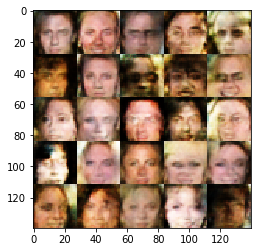

Epoch: 0/1      Batch: 2410      Discriminator Loss: 1.2072      Generator Loss: 0.8292     
Epoch: 0/1      Batch: 2420      Discriminator Loss: 1.2613      Generator Loss: 0.7708     
Epoch: 0/1      Batch: 2430      Discriminator Loss: 1.3208      Generator Loss: 0.7805     
Epoch: 0/1      Batch: 2440      Discriminator Loss: 1.2939      Generator Loss: 0.9133     
Epoch: 0/1      Batch: 2450      Discriminator Loss: 1.2161      Generator Loss: 0.7348     


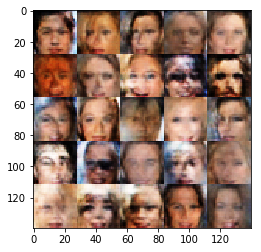

Epoch: 0/1      Batch: 2460      Discriminator Loss: 1.1268      Generator Loss: 1.0498     
Epoch: 0/1      Batch: 2470      Discriminator Loss: 1.2048      Generator Loss: 0.7120     
Epoch: 0/1      Batch: 2480      Discriminator Loss: 1.2299      Generator Loss: 1.0585     
Epoch: 0/1      Batch: 2490      Discriminator Loss: 1.1483      Generator Loss: 0.9126     
Epoch: 0/1      Batch: 2500      Discriminator Loss: 1.2480      Generator Loss: 0.9652     


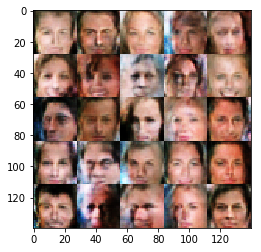

Epoch: 0/1      Batch: 2510      Discriminator Loss: 1.2135      Generator Loss: 0.9885     
Epoch: 0/1      Batch: 2520      Discriminator Loss: 1.2871      Generator Loss: 0.9173     
Epoch: 0/1      Batch: 2530      Discriminator Loss: 1.3074      Generator Loss: 0.6836     
Epoch: 0/1      Batch: 2540      Discriminator Loss: 1.2770      Generator Loss: 0.7114     
Epoch: 0/1      Batch: 2550      Discriminator Loss: 1.2090      Generator Loss: 0.7543     


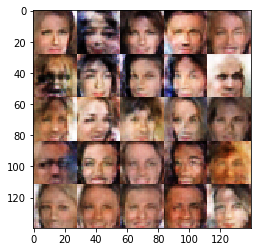

Epoch: 0/1      Batch: 2560      Discriminator Loss: 1.1607      Generator Loss: 0.9536     
Epoch: 0/1      Batch: 2570      Discriminator Loss: 1.2480      Generator Loss: 0.8256     
Epoch: 0/1      Batch: 2580      Discriminator Loss: 1.2790      Generator Loss: 1.2625     
Epoch: 0/1      Batch: 2590      Discriminator Loss: 1.5186      Generator Loss: 0.5746     
Epoch: 0/1      Batch: 2600      Discriminator Loss: 1.2179      Generator Loss: 0.7550     


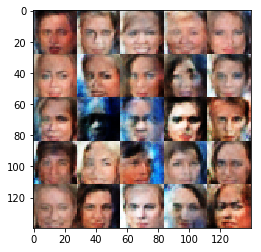

Epoch: 0/1      Batch: 2610      Discriminator Loss: 1.1118      Generator Loss: 0.8937     
Epoch: 0/1      Batch: 2620      Discriminator Loss: 1.2758      Generator Loss: 0.8569     
Epoch: 0/1      Batch: 2630      Discriminator Loss: 1.2909      Generator Loss: 0.8121     
Epoch: 0/1      Batch: 2640      Discriminator Loss: 1.4194      Generator Loss: 0.6746     
Epoch: 0/1      Batch: 2650      Discriminator Loss: 1.2708      Generator Loss: 0.6699     


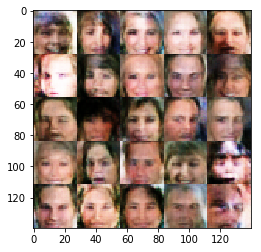

Epoch: 0/1      Batch: 2660      Discriminator Loss: 1.3872      Generator Loss: 0.7696     
Epoch: 0/1      Batch: 2670      Discriminator Loss: 1.5440      Generator Loss: 0.7196     
Epoch: 0/1      Batch: 2680      Discriminator Loss: 1.1389      Generator Loss: 0.8773     
Epoch: 0/1      Batch: 2690      Discriminator Loss: 1.2420      Generator Loss: 1.0629     
Epoch: 0/1      Batch: 2700      Discriminator Loss: 1.4061      Generator Loss: 0.7972     


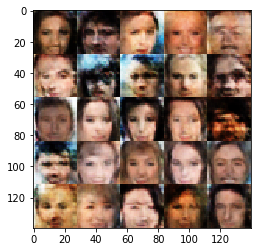

Epoch: 0/1      Batch: 2710      Discriminator Loss: 1.4598      Generator Loss: 0.6850     
Epoch: 0/1      Batch: 2720      Discriminator Loss: 1.1933      Generator Loss: 1.1312     
Epoch: 0/1      Batch: 2730      Discriminator Loss: 1.1478      Generator Loss: 1.1625     
Epoch: 0/1      Batch: 2740      Discriminator Loss: 1.1108      Generator Loss: 1.0353     
Epoch: 0/1      Batch: 2750      Discriminator Loss: 1.1997      Generator Loss: 0.9972     


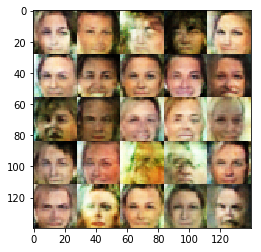

Epoch: 0/1      Batch: 2760      Discriminator Loss: 1.1888      Generator Loss: 0.9246     
Epoch: 0/1      Batch: 2770      Discriminator Loss: 1.4323      Generator Loss: 0.6296     
Epoch: 0/1      Batch: 2780      Discriminator Loss: 1.2255      Generator Loss: 0.8177     
Epoch: 0/1      Batch: 2790      Discriminator Loss: 1.1795      Generator Loss: 0.8877     
Epoch: 0/1      Batch: 2800      Discriminator Loss: 1.3289      Generator Loss: 1.0489     


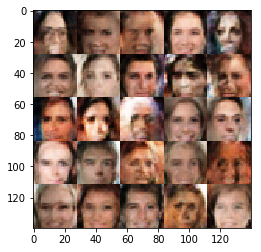

Epoch: 0/1      Batch: 2810      Discriminator Loss: 1.4021      Generator Loss: 0.6877     
Epoch: 0/1      Batch: 2820      Discriminator Loss: 1.2241      Generator Loss: 0.7953     
Epoch: 0/1      Batch: 2830      Discriminator Loss: 1.2987      Generator Loss: 0.9081     
Epoch: 0/1      Batch: 2840      Discriminator Loss: 1.3076      Generator Loss: 0.8338     
Epoch: 0/1      Batch: 2850      Discriminator Loss: 1.3445      Generator Loss: 0.8529     


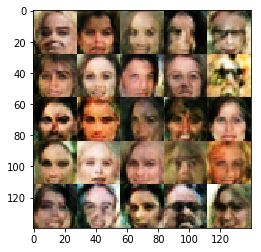

Epoch: 0/1      Batch: 2860      Discriminator Loss: 1.4286      Generator Loss: 0.7171     
Epoch: 0/1      Batch: 2870      Discriminator Loss: 1.0517      Generator Loss: 1.1302     
Epoch: 0/1      Batch: 2880      Discriminator Loss: 1.4471      Generator Loss: 0.6162     
Epoch: 0/1      Batch: 2890      Discriminator Loss: 1.4199      Generator Loss: 0.8573     
Epoch: 0/1      Batch: 2900      Discriminator Loss: 1.1766      Generator Loss: 0.9973     


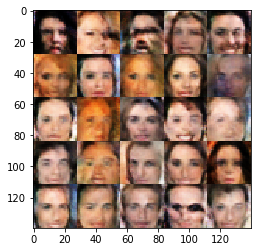

Epoch: 0/1      Batch: 2910      Discriminator Loss: 1.1731      Generator Loss: 1.0663     
Epoch: 0/1      Batch: 2920      Discriminator Loss: 1.3860      Generator Loss: 1.0743     
Epoch: 0/1      Batch: 2930      Discriminator Loss: 1.2989      Generator Loss: 0.7879     
Epoch: 0/1      Batch: 2940      Discriminator Loss: 1.2996      Generator Loss: 1.1127     
Epoch: 0/1      Batch: 2950      Discriminator Loss: 1.3581      Generator Loss: 0.7804     


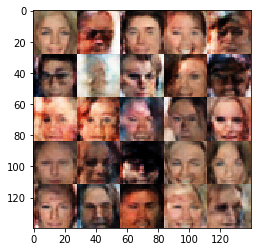

Epoch: 0/1      Batch: 2960      Discriminator Loss: 1.2481      Generator Loss: 0.9442     
Epoch: 0/1      Batch: 2970      Discriminator Loss: 1.2957      Generator Loss: 0.9357     
Epoch: 0/1      Batch: 2980      Discriminator Loss: 0.9667      Generator Loss: 1.0985     
Epoch: 0/1      Batch: 2990      Discriminator Loss: 1.2491      Generator Loss: 0.7819     
Epoch: 0/1      Batch: 3000      Discriminator Loss: 1.4529      Generator Loss: 0.7824     


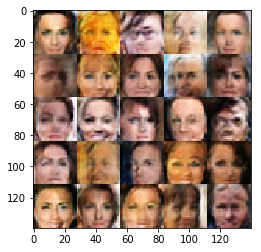

Epoch: 0/1      Batch: 3010      Discriminator Loss: 1.2651      Generator Loss: 0.7442     
Epoch: 0/1      Batch: 3020      Discriminator Loss: 1.2272      Generator Loss: 1.0213     
Epoch: 0/1      Batch: 3030      Discriminator Loss: 1.4684      Generator Loss: 0.7426     
Epoch: 0/1      Batch: 3040      Discriminator Loss: 1.3737      Generator Loss: 0.8490     
Epoch: 0/1      Batch: 3050      Discriminator Loss: 1.1900      Generator Loss: 0.9864     


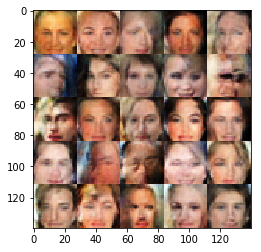

Epoch: 0/1      Batch: 3060      Discriminator Loss: 1.2102      Generator Loss: 0.9741     
Epoch: 0/1      Batch: 3070      Discriminator Loss: 1.7304      Generator Loss: 0.5101     
Epoch: 0/1      Batch: 3080      Discriminator Loss: 1.2823      Generator Loss: 0.8802     
Epoch: 0/1      Batch: 3090      Discriminator Loss: 1.1642      Generator Loss: 0.8991     
Epoch: 0/1      Batch: 3100      Discriminator Loss: 1.3762      Generator Loss: 0.9014     


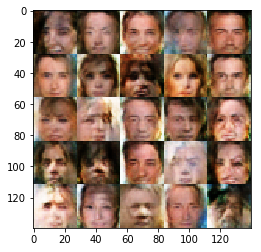

Epoch: 0/1      Batch: 3110      Discriminator Loss: 1.2693      Generator Loss: 0.7919     
Epoch: 0/1      Batch: 3120      Discriminator Loss: 1.2938      Generator Loss: 1.0139     
Epoch: 0/1      Batch: 3130      Discriminator Loss: 1.2468      Generator Loss: 0.6807     
Epoch: 0/1      Batch: 3140      Discriminator Loss: 1.3060      Generator Loss: 0.9673     
Epoch: 0/1      Batch: 3150      Discriminator Loss: 1.2377      Generator Loss: 0.9957     


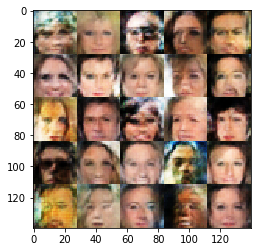

Epoch: 0/1      Batch: 3160      Discriminator Loss: 1.3862      Generator Loss: 0.9190     
Epoch: 0/1      Batch: 3170      Discriminator Loss: 1.3348      Generator Loss: 0.7524     
Epoch: 0/1      Batch: 3180      Discriminator Loss: 1.2421      Generator Loss: 0.9353     
Epoch: 0/1      Batch: 3190      Discriminator Loss: 1.2220      Generator Loss: 0.9039     
Epoch: 0/1      Batch: 3200      Discriminator Loss: 1.1456      Generator Loss: 0.9527     


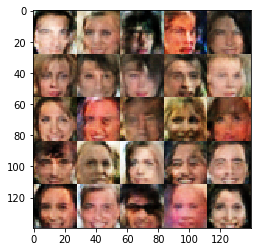

Epoch: 0/1      Batch: 3210      Discriminator Loss: 1.3002      Generator Loss: 0.7824     
Epoch: 0/1      Batch: 3220      Discriminator Loss: 1.2345      Generator Loss: 0.7702     
Epoch: 0/1      Batch: 3230      Discriminator Loss: 1.3759      Generator Loss: 0.7497     
Epoch: 0/1      Batch: 3240      Discriminator Loss: 1.1752      Generator Loss: 0.9845     
Epoch: 0/1      Batch: 3250      Discriminator Loss: 1.3071      Generator Loss: 0.9037     


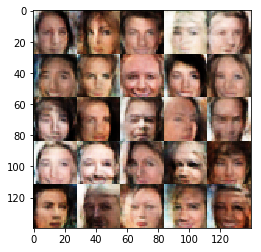

Epoch: 0/1      Batch: 3260      Discriminator Loss: 1.3613      Generator Loss: 0.7622     
Epoch: 0/1      Batch: 3270      Discriminator Loss: 1.5325      Generator Loss: 0.6559     
Epoch: 0/1      Batch: 3280      Discriminator Loss: 1.1886      Generator Loss: 1.0076     
Epoch: 0/1      Batch: 3290      Discriminator Loss: 1.1215      Generator Loss: 1.3384     
Epoch: 0/1      Batch: 3300      Discriminator Loss: 1.4068      Generator Loss: 0.6297     


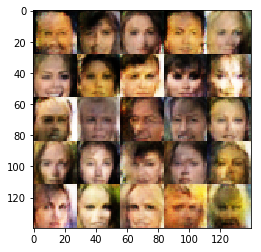

Epoch: 0/1      Batch: 3310      Discriminator Loss: 1.3199      Generator Loss: 0.7572     
Epoch: 0/1      Batch: 3320      Discriminator Loss: 1.3874      Generator Loss: 0.7048     
Epoch: 0/1      Batch: 3330      Discriminator Loss: 1.1813      Generator Loss: 0.9854     
Epoch: 0/1      Batch: 3340      Discriminator Loss: 1.0462      Generator Loss: 1.1195     
Epoch: 0/1      Batch: 3350      Discriminator Loss: 1.3436      Generator Loss: 1.0553     


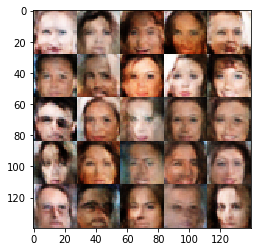

Epoch: 0/1      Batch: 3360      Discriminator Loss: 1.2635      Generator Loss: 0.7303     
Epoch: 0/1      Batch: 3370      Discriminator Loss: 1.2584      Generator Loss: 0.7456     
Epoch: 0/1      Batch: 3380      Discriminator Loss: 1.4439      Generator Loss: 0.6322     
Epoch: 0/1      Batch: 3390      Discriminator Loss: 1.4360      Generator Loss: 0.8178     
Epoch: 0/1      Batch: 3400      Discriminator Loss: 1.2736      Generator Loss: 0.9026     


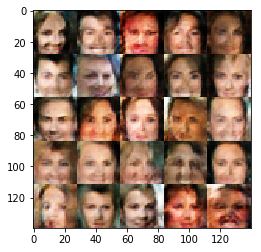

Epoch: 0/1      Batch: 3410      Discriminator Loss: 1.3091      Generator Loss: 0.8473     
Epoch: 0/1      Batch: 3420      Discriminator Loss: 1.3464      Generator Loss: 0.8976     
Epoch: 0/1      Batch: 3430      Discriminator Loss: 1.2790      Generator Loss: 0.6585     
Epoch: 0/1      Batch: 3440      Discriminator Loss: 1.0527      Generator Loss: 1.0456     
Epoch: 0/1      Batch: 3450      Discriminator Loss: 1.0128      Generator Loss: 0.9879     


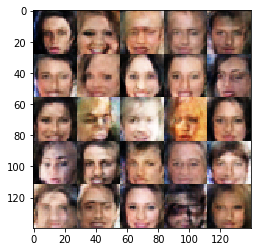

Epoch: 0/1      Batch: 3460      Discriminator Loss: 1.4141      Generator Loss: 0.6939     
Epoch: 0/1      Batch: 3470      Discriminator Loss: 1.3493      Generator Loss: 1.0694     
Epoch: 0/1      Batch: 3480      Discriminator Loss: 1.2001      Generator Loss: 0.9376     
Epoch: 0/1      Batch: 3490      Discriminator Loss: 1.1076      Generator Loss: 0.9752     
Epoch: 0/1      Batch: 3500      Discriminator Loss: 1.1153      Generator Loss: 0.8823     


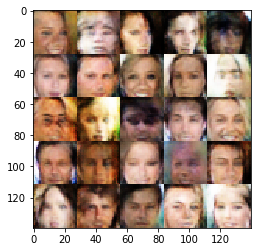

Epoch: 0/1      Batch: 3510      Discriminator Loss: 1.3114      Generator Loss: 0.7275     
Epoch: 0/1      Batch: 3520      Discriminator Loss: 1.4154      Generator Loss: 0.6226     
Epoch: 0/1      Batch: 3530      Discriminator Loss: 1.3056      Generator Loss: 0.9542     
Epoch: 0/1      Batch: 3540      Discriminator Loss: 1.4278      Generator Loss: 0.5691     
Epoch: 0/1      Batch: 3550      Discriminator Loss: 1.5017      Generator Loss: 0.7333     


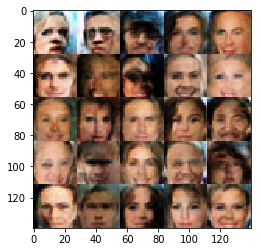

Epoch: 0/1      Batch: 3560      Discriminator Loss: 1.1143      Generator Loss: 1.0155     
Epoch: 0/1      Batch: 3570      Discriminator Loss: 1.3062      Generator Loss: 0.7850     
Epoch: 0/1      Batch: 3580      Discriminator Loss: 1.4190      Generator Loss: 0.8707     
Epoch: 0/1      Batch: 3590      Discriminator Loss: 1.3286      Generator Loss: 0.8356     
Epoch: 0/1      Batch: 3600      Discriminator Loss: 1.2956      Generator Loss: 0.9433     


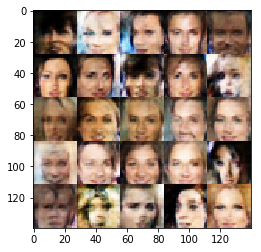

Epoch: 0/1      Batch: 3610      Discriminator Loss: 1.2344      Generator Loss: 0.7555     
Epoch: 0/1      Batch: 3620      Discriminator Loss: 1.2193      Generator Loss: 0.9613     
Epoch: 0/1      Batch: 3630      Discriminator Loss: 1.3782      Generator Loss: 0.9334     
Epoch: 0/1      Batch: 3640      Discriminator Loss: 1.2835      Generator Loss: 0.9704     
Epoch: 0/1      Batch: 3650      Discriminator Loss: 1.3273      Generator Loss: 0.7410     


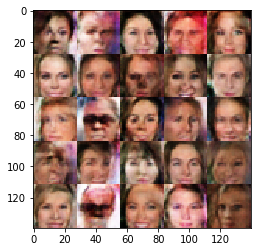

Epoch: 0/1      Batch: 3660      Discriminator Loss: 1.1709      Generator Loss: 0.9078     
Epoch: 0/1      Batch: 3670      Discriminator Loss: 1.3227      Generator Loss: 0.5819     
Epoch: 0/1      Batch: 3680      Discriminator Loss: 1.1618      Generator Loss: 0.8385     
Epoch: 0/1      Batch: 3690      Discriminator Loss: 1.1982      Generator Loss: 0.8051     
Epoch: 0/1      Batch: 3700      Discriminator Loss: 1.1167      Generator Loss: 0.8605     


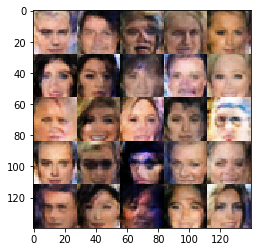

Epoch: 0/1      Batch: 3710      Discriminator Loss: 1.3191      Generator Loss: 0.9942     
Epoch: 0/1      Batch: 3720      Discriminator Loss: 1.3403      Generator Loss: 0.7884     
Epoch: 0/1      Batch: 3730      Discriminator Loss: 1.2274      Generator Loss: 0.8423     
Epoch: 0/1      Batch: 3740      Discriminator Loss: 1.3984      Generator Loss: 0.6907     
Epoch: 0/1      Batch: 3750      Discriminator Loss: 1.2705      Generator Loss: 0.9702     


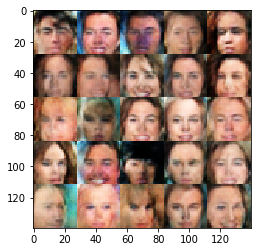

Epoch: 0/1      Batch: 3760      Discriminator Loss: 1.2386      Generator Loss: 0.9426     
Epoch: 0/1      Batch: 3770      Discriminator Loss: 1.3869      Generator Loss: 1.1783     
Epoch: 0/1      Batch: 3780      Discriminator Loss: 1.2891      Generator Loss: 0.7173     
Epoch: 0/1      Batch: 3790      Discriminator Loss: 1.1781      Generator Loss: 0.9786     
Epoch: 0/1      Batch: 3800      Discriminator Loss: 1.4720      Generator Loss: 0.6180     


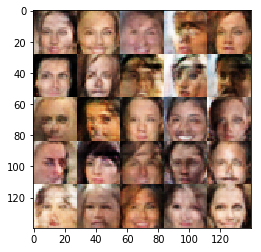

Epoch: 0/1      Batch: 3810      Discriminator Loss: 1.2488      Generator Loss: 0.9578     
Epoch: 0/1      Batch: 3820      Discriminator Loss: 1.2971      Generator Loss: 0.8461     
Epoch: 0/1      Batch: 3830      Discriminator Loss: 1.3967      Generator Loss: 0.7484     
Epoch: 0/1      Batch: 3840      Discriminator Loss: 1.3859      Generator Loss: 0.6622     
Epoch: 0/1      Batch: 3850      Discriminator Loss: 1.1550      Generator Loss: 1.0075     


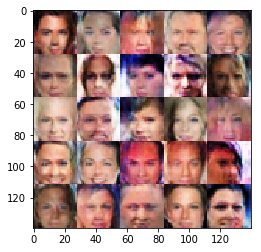

Epoch: 0/1      Batch: 3860      Discriminator Loss: 1.3374      Generator Loss: 0.8011     
Epoch: 0/1      Batch: 3870      Discriminator Loss: 1.2897      Generator Loss: 0.8322     
Epoch: 0/1      Batch: 3880      Discriminator Loss: 1.3643      Generator Loss: 0.5697     
Epoch: 0/1      Batch: 3890      Discriminator Loss: 1.1142      Generator Loss: 1.1952     
Epoch: 0/1      Batch: 3900      Discriminator Loss: 1.2301      Generator Loss: 0.7587     


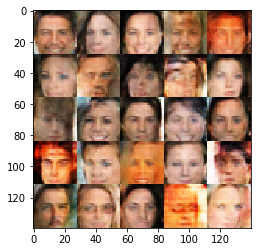

Epoch: 0/1      Batch: 3910      Discriminator Loss: 1.0888      Generator Loss: 0.8904     
Epoch: 0/1      Batch: 3920      Discriminator Loss: 1.3868      Generator Loss: 0.7080     
Epoch: 0/1      Batch: 3930      Discriminator Loss: 1.2275      Generator Loss: 0.7389     
Epoch: 0/1      Batch: 3940      Discriminator Loss: 1.1757      Generator Loss: 1.0773     
Epoch: 0/1      Batch: 3950      Discriminator Loss: 1.0944      Generator Loss: 0.8435     


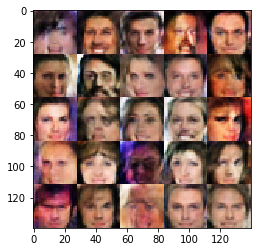

Epoch: 0/1      Batch: 3960      Discriminator Loss: 1.1660      Generator Loss: 0.9571     
Epoch: 0/1      Batch: 3970      Discriminator Loss: 1.3509      Generator Loss: 0.6765     
Epoch: 0/1      Batch: 3980      Discriminator Loss: 1.1986      Generator Loss: 1.1363     
Epoch: 0/1      Batch: 3990      Discriminator Loss: 1.1838      Generator Loss: 0.7592     
Epoch: 0/1      Batch: 4000      Discriminator Loss: 1.3105      Generator Loss: 0.8658     


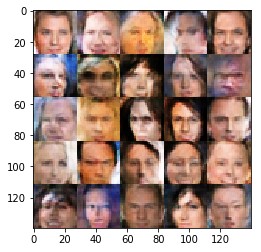

Epoch: 0/1      Batch: 4010      Discriminator Loss: 1.5279      Generator Loss: 0.6738     
Epoch: 0/1      Batch: 4020      Discriminator Loss: 1.2763      Generator Loss: 0.7403     
Epoch: 0/1      Batch: 4030      Discriminator Loss: 1.4581      Generator Loss: 0.6563     
Epoch: 0/1      Batch: 4040      Discriminator Loss: 1.2992      Generator Loss: 0.9496     
Epoch: 0/1      Batch: 4050      Discriminator Loss: 1.3929      Generator Loss: 0.7639     


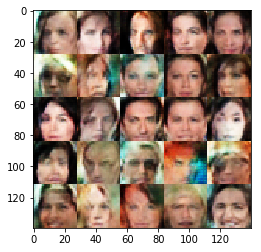

Epoch: 0/1      Batch: 4060      Discriminator Loss: 1.2044      Generator Loss: 1.0343     
Epoch: 0/1      Batch: 4070      Discriminator Loss: 1.2637      Generator Loss: 0.7131     
Epoch: 0/1      Batch: 4080      Discriminator Loss: 1.2141      Generator Loss: 0.8909     
Epoch: 0/1      Batch: 4090      Discriminator Loss: 1.2061      Generator Loss: 1.0283     
Epoch: 0/1      Batch: 4100      Discriminator Loss: 1.2113      Generator Loss: 0.9893     


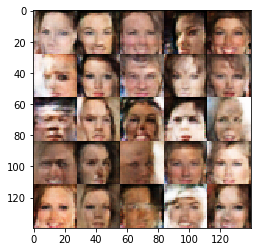

Epoch: 0/1      Batch: 4110      Discriminator Loss: 1.5690      Generator Loss: 0.6399     
Epoch: 0/1      Batch: 4120      Discriminator Loss: 1.0752      Generator Loss: 1.0394     
Epoch: 0/1      Batch: 4130      Discriminator Loss: 1.1332      Generator Loss: 1.0745     
Epoch: 0/1      Batch: 4140      Discriminator Loss: 1.3523      Generator Loss: 0.9166     
Epoch: 0/1      Batch: 4150      Discriminator Loss: 1.2473      Generator Loss: 0.7895     


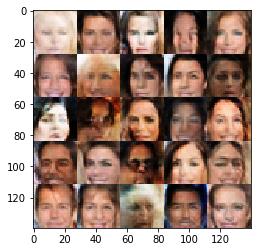

Epoch: 0/1      Batch: 4160      Discriminator Loss: 1.2084      Generator Loss: 0.7180     
Epoch: 0/1      Batch: 4170      Discriminator Loss: 1.2949      Generator Loss: 0.7278     
Epoch: 0/1      Batch: 4180      Discriminator Loss: 1.2965      Generator Loss: 0.8011     
Epoch: 0/1      Batch: 4190      Discriminator Loss: 1.2691      Generator Loss: 0.8769     
Epoch: 0/1      Batch: 4200      Discriminator Loss: 1.2349      Generator Loss: 0.9896     


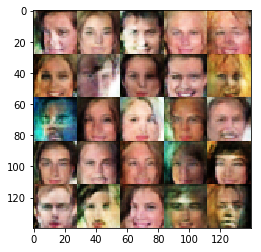

Epoch: 0/1      Batch: 4210      Discriminator Loss: 1.3477      Generator Loss: 0.8011     
Epoch: 0/1      Batch: 4220      Discriminator Loss: 1.0659      Generator Loss: 1.0294     
Epoch: 0/1      Batch: 4230      Discriminator Loss: 1.4247      Generator Loss: 0.5657     
Epoch: 0/1      Batch: 4240      Discriminator Loss: 1.1752      Generator Loss: 0.9062     
Epoch: 0/1      Batch: 4250      Discriminator Loss: 1.3569      Generator Loss: 1.0218     


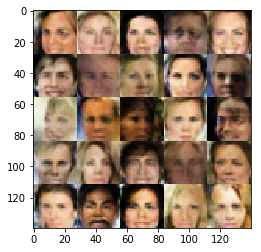

Epoch: 0/1      Batch: 4260      Discriminator Loss: 1.1812      Generator Loss: 1.2838     
Epoch: 0/1      Batch: 4270      Discriminator Loss: 1.1266      Generator Loss: 0.9459     
Epoch: 0/1      Batch: 4280      Discriminator Loss: 1.2542      Generator Loss: 0.6541     
Epoch: 0/1      Batch: 4290      Discriminator Loss: 1.3384      Generator Loss: 0.8103     
Epoch: 0/1      Batch: 4300      Discriminator Loss: 1.2407      Generator Loss: 0.7529     


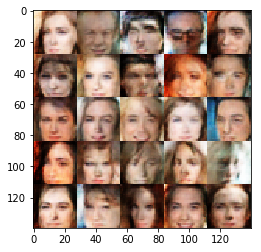

Epoch: 0/1      Batch: 4310      Discriminator Loss: 1.1465      Generator Loss: 0.9527     
Epoch: 0/1      Batch: 4320      Discriminator Loss: 1.3039      Generator Loss: 0.7236     
Epoch: 0/1      Batch: 4330      Discriminator Loss: 1.3085      Generator Loss: 0.8928     
Epoch: 0/1      Batch: 4340      Discriminator Loss: 1.3276      Generator Loss: 0.7838     
Epoch: 0/1      Batch: 4350      Discriminator Loss: 1.2988      Generator Loss: 1.1038     


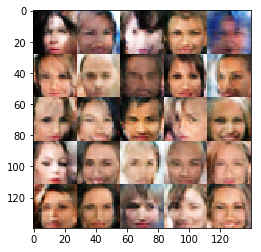

Epoch: 0/1      Batch: 4360      Discriminator Loss: 1.4056      Generator Loss: 0.6767     
Epoch: 0/1      Batch: 4370      Discriminator Loss: 1.3823      Generator Loss: 0.8017     
Epoch: 0/1      Batch: 4380      Discriminator Loss: 1.4250      Generator Loss: 0.6083     
Epoch: 0/1      Batch: 4390      Discriminator Loss: 1.1021      Generator Loss: 0.9868     
Epoch: 0/1      Batch: 4400      Discriminator Loss: 1.2743      Generator Loss: 0.7289     


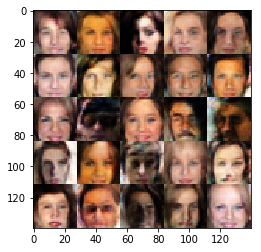

Epoch: 0/1      Batch: 4410      Discriminator Loss: 1.3980      Generator Loss: 0.6612     
Epoch: 0/1      Batch: 4420      Discriminator Loss: 1.1643      Generator Loss: 0.9583     
Epoch: 0/1      Batch: 4430      Discriminator Loss: 1.2051      Generator Loss: 0.7329     
Epoch: 0/1      Batch: 4440      Discriminator Loss: 1.3732      Generator Loss: 0.7385     
Epoch: 0/1      Batch: 4450      Discriminator Loss: 1.3753      Generator Loss: 0.7201     


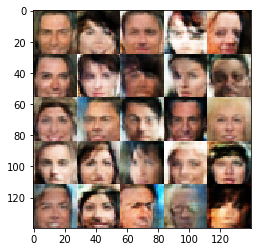

Epoch: 0/1      Batch: 4460      Discriminator Loss: 1.1751      Generator Loss: 0.7856     
Epoch: 0/1      Batch: 4470      Discriminator Loss: 1.2077      Generator Loss: 1.1572     
Epoch: 0/1      Batch: 4480      Discriminator Loss: 1.2636      Generator Loss: 0.6871     
Epoch: 0/1      Batch: 4490      Discriminator Loss: 1.2703      Generator Loss: 0.8295     
Epoch: 0/1      Batch: 4500      Discriminator Loss: 1.2537      Generator Loss: 0.6494     


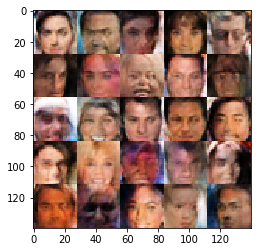

Epoch: 0/1      Batch: 4510      Discriminator Loss: 1.2546      Generator Loss: 0.7356     
Epoch: 0/1      Batch: 4520      Discriminator Loss: 1.2295      Generator Loss: 1.0721     
Epoch: 0/1      Batch: 4530      Discriminator Loss: 1.1456      Generator Loss: 1.1053     
Epoch: 0/1      Batch: 4540      Discriminator Loss: 1.1702      Generator Loss: 0.9381     
Epoch: 0/1      Batch: 4550      Discriminator Loss: 1.3073      Generator Loss: 1.3258     


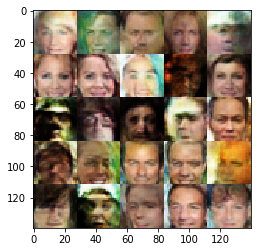

Epoch: 0/1      Batch: 4560      Discriminator Loss: 1.0633      Generator Loss: 1.1142     
Epoch: 0/1      Batch: 4570      Discriminator Loss: 1.1740      Generator Loss: 1.1522     
Epoch: 0/1      Batch: 4580      Discriminator Loss: 1.4637      Generator Loss: 0.6335     
Epoch: 0/1      Batch: 4590      Discriminator Loss: 1.3405      Generator Loss: 0.6659     
Epoch: 0/1      Batch: 4600      Discriminator Loss: 1.1918      Generator Loss: 0.8543     


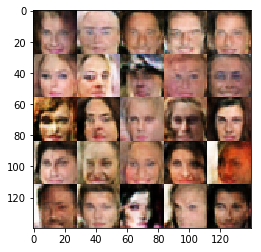

Epoch: 0/1      Batch: 4610      Discriminator Loss: 0.9470      Generator Loss: 1.3088     
Epoch: 0/1      Batch: 4620      Discriminator Loss: 1.3619      Generator Loss: 0.6063     
Epoch: 0/1      Batch: 4630      Discriminator Loss: 1.3649      Generator Loss: 0.6820     
Epoch: 0/1      Batch: 4640      Discriminator Loss: 1.3625      Generator Loss: 0.7482     
Epoch: 0/1      Batch: 4650      Discriminator Loss: 1.1303      Generator Loss: 1.0406     


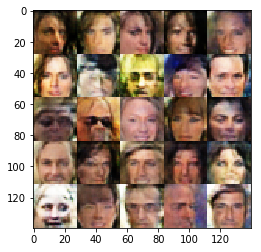

Epoch: 0/1      Batch: 4660      Discriminator Loss: 1.6959      Generator Loss: 0.5702     
Epoch: 0/1      Batch: 4670      Discriminator Loss: 1.2929      Generator Loss: 1.0090     
Epoch: 0/1      Batch: 4680      Discriminator Loss: 1.1504      Generator Loss: 1.0238     
Epoch: 0/1      Batch: 4690      Discriminator Loss: 1.1887      Generator Loss: 0.7714     
Epoch: 0/1      Batch: 4700      Discriminator Loss: 1.1746      Generator Loss: 0.8204     


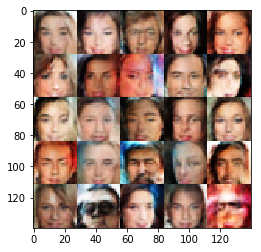

Epoch: 0/1      Batch: 4710      Discriminator Loss: 1.2219      Generator Loss: 0.8546     
Epoch: 0/1      Batch: 4720      Discriminator Loss: 1.1270      Generator Loss: 0.7853     
Epoch: 0/1      Batch: 4730      Discriminator Loss: 1.1728      Generator Loss: 0.9464     
Epoch: 0/1      Batch: 4740      Discriminator Loss: 1.2269      Generator Loss: 0.7121     
Epoch: 0/1      Batch: 4750      Discriminator Loss: 1.3543      Generator Loss: 0.6860     


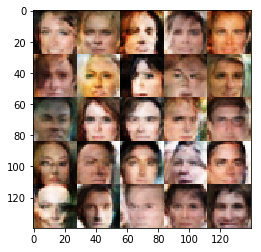

Epoch: 0/1      Batch: 4760      Discriminator Loss: 1.3011      Generator Loss: 0.7341     
Epoch: 0/1      Batch: 4770      Discriminator Loss: 1.4831      Generator Loss: 0.7170     
Epoch: 0/1      Batch: 4780      Discriminator Loss: 1.1579      Generator Loss: 0.8573     
Epoch: 0/1      Batch: 4790      Discriminator Loss: 1.2452      Generator Loss: 0.9291     
Epoch: 0/1      Batch: 4800      Discriminator Loss: 1.2062      Generator Loss: 0.7328     


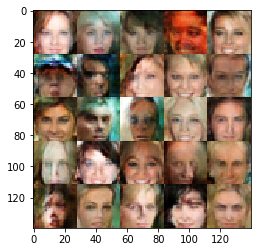

Epoch: 0/1      Batch: 4810      Discriminator Loss: 1.1734      Generator Loss: 0.9687     
Epoch: 0/1      Batch: 4820      Discriminator Loss: 1.2528      Generator Loss: 0.8165     
Epoch: 0/1      Batch: 4830      Discriminator Loss: 1.2360      Generator Loss: 1.0586     
Epoch: 0/1      Batch: 4840      Discriminator Loss: 1.1081      Generator Loss: 0.8313     
Epoch: 0/1      Batch: 4850      Discriminator Loss: 1.2608      Generator Loss: 0.9941     


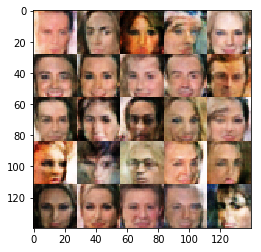

Epoch: 0/1      Batch: 4860      Discriminator Loss: 1.2402      Generator Loss: 0.6748     
Epoch: 0/1      Batch: 4870      Discriminator Loss: 1.2534      Generator Loss: 0.7783     
Epoch: 0/1      Batch: 4880      Discriminator Loss: 1.3327      Generator Loss: 0.6953     
Epoch: 0/1      Batch: 4890      Discriminator Loss: 1.3986      Generator Loss: 0.8398     
Epoch: 0/1      Batch: 4900      Discriminator Loss: 1.3298      Generator Loss: 0.9061     


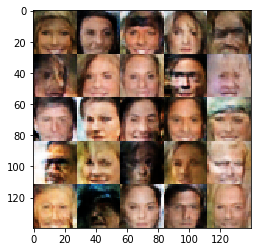

Epoch: 0/1      Batch: 4910      Discriminator Loss: 1.2831      Generator Loss: 0.7812     
Epoch: 0/1      Batch: 4920      Discriminator Loss: 1.1028      Generator Loss: 0.9163     
Epoch: 0/1      Batch: 4930      Discriminator Loss: 1.2489      Generator Loss: 1.0471     
Epoch: 0/1      Batch: 4940      Discriminator Loss: 1.4209      Generator Loss: 0.7186     
Epoch: 0/1      Batch: 4950      Discriminator Loss: 1.1625      Generator Loss: 0.7897     


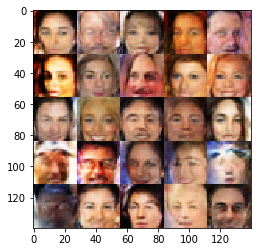

Epoch: 0/1      Batch: 4960      Discriminator Loss: 1.1203      Generator Loss: 1.0103     
Epoch: 0/1      Batch: 4970      Discriminator Loss: 1.0620      Generator Loss: 0.9143     
Epoch: 0/1      Batch: 4980      Discriminator Loss: 1.1933      Generator Loss: 1.0840     
Epoch: 0/1      Batch: 4990      Discriminator Loss: 1.3537      Generator Loss: 0.7263     
Epoch: 0/1      Batch: 5000      Discriminator Loss: 1.1773      Generator Loss: 0.8405     


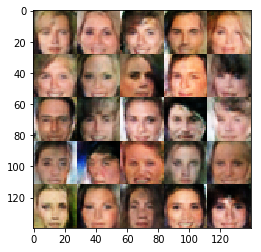

Epoch: 0/1      Batch: 5010      Discriminator Loss: 1.6900      Generator Loss: 0.7125     
Epoch: 0/1      Batch: 5020      Discriminator Loss: 1.3296      Generator Loss: 1.0488     
Epoch: 0/1      Batch: 5030      Discriminator Loss: 1.4443      Generator Loss: 0.9922     
Epoch: 0/1      Batch: 5040      Discriminator Loss: 1.3120      Generator Loss: 0.7280     
Epoch: 0/1      Batch: 5050      Discriminator Loss: 1.2560      Generator Loss: 0.8625     


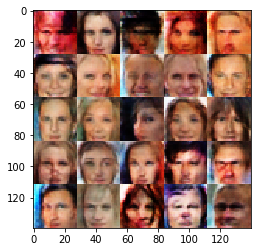

Epoch: 0/1      Batch: 5060      Discriminator Loss: 1.3853      Generator Loss: 0.6581     
Epoch: 0/1      Batch: 5070      Discriminator Loss: 1.1998      Generator Loss: 0.9265     
Epoch: 0/1      Batch: 5080      Discriminator Loss: 1.5069      Generator Loss: 0.8119     
Epoch: 0/1      Batch: 5090      Discriminator Loss: 1.1689      Generator Loss: 0.8156     
Epoch: 0/1      Batch: 5100      Discriminator Loss: 1.1043      Generator Loss: 1.1322     


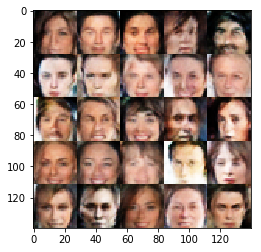

Epoch: 0/1      Batch: 5110      Discriminator Loss: 1.1495      Generator Loss: 0.9628     
Epoch: 0/1      Batch: 5120      Discriminator Loss: 1.2114      Generator Loss: 1.0727     
Epoch: 0/1      Batch: 5130      Discriminator Loss: 1.1566      Generator Loss: 0.8237     
Epoch: 0/1      Batch: 5140      Discriminator Loss: 1.2526      Generator Loss: 0.9355     
Epoch: 0/1      Batch: 5150      Discriminator Loss: 1.1950      Generator Loss: 0.8543     


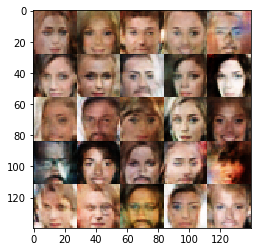

Epoch: 0/1      Batch: 5160      Discriminator Loss: 1.3633      Generator Loss: 0.7706     
Epoch: 0/1      Batch: 5170      Discriminator Loss: 1.2957      Generator Loss: 0.7006     
Epoch: 0/1      Batch: 5180      Discriminator Loss: 1.3141      Generator Loss: 0.9080     
Epoch: 0/1      Batch: 5190      Discriminator Loss: 1.3476      Generator Loss: 0.6085     
Epoch: 0/1      Batch: 5200      Discriminator Loss: 1.2074      Generator Loss: 1.1455     


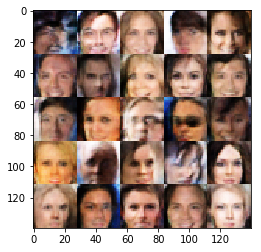

Epoch: 0/1      Batch: 5210      Discriminator Loss: 1.2346      Generator Loss: 0.9596     
Epoch: 0/1      Batch: 5220      Discriminator Loss: 1.2192      Generator Loss: 0.7372     
Epoch: 0/1      Batch: 5230      Discriminator Loss: 1.2172      Generator Loss: 1.3007     
Epoch: 0/1      Batch: 5240      Discriminator Loss: 1.1158      Generator Loss: 0.9936     
Epoch: 0/1      Batch: 5250      Discriminator Loss: 1.2955      Generator Loss: 0.9735     


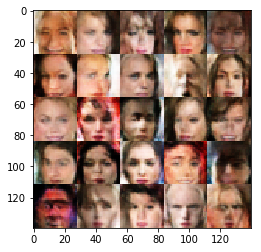

Epoch: 0/1      Batch: 5260      Discriminator Loss: 1.5174      Generator Loss: 0.8787     
Epoch: 0/1      Batch: 5270      Discriminator Loss: 1.1750      Generator Loss: 1.0856     
Epoch: 0/1      Batch: 5280      Discriminator Loss: 1.1268      Generator Loss: 0.9387     
Epoch: 0/1      Batch: 5290      Discriminator Loss: 1.2047      Generator Loss: 0.7694     
Epoch: 0/1      Batch: 5300      Discriminator Loss: 1.3520      Generator Loss: 0.7926     


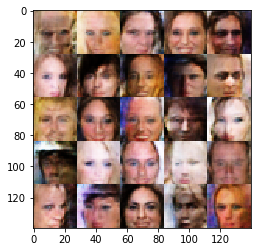

Epoch: 0/1      Batch: 5310      Discriminator Loss: 1.1204      Generator Loss: 0.9532     
Epoch: 0/1      Batch: 5320      Discriminator Loss: 1.2538      Generator Loss: 0.7954     
Epoch: 0/1      Batch: 5330      Discriminator Loss: 1.0913      Generator Loss: 1.0202     
Epoch: 0/1      Batch: 5340      Discriminator Loss: 1.2610      Generator Loss: 0.6961     
Epoch: 0/1      Batch: 5350      Discriminator Loss: 1.1925      Generator Loss: 0.7574     


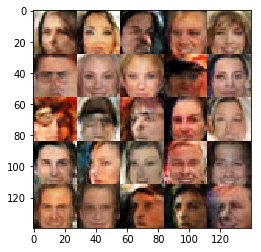

Epoch: 0/1      Batch: 5360      Discriminator Loss: 1.2129      Generator Loss: 0.8853     
Epoch: 0/1      Batch: 5370      Discriminator Loss: 1.4597      Generator Loss: 1.0336     
Epoch: 0/1      Batch: 5380      Discriminator Loss: 1.1530      Generator Loss: 1.0021     
Epoch: 0/1      Batch: 5390      Discriminator Loss: 1.2228      Generator Loss: 0.9704     
Epoch: 0/1      Batch: 5400      Discriminator Loss: 1.3201      Generator Loss: 0.8877     


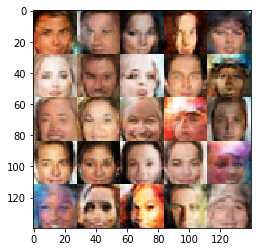

Epoch: 0/1      Batch: 5410      Discriminator Loss: 1.0414      Generator Loss: 1.0727     
Epoch: 0/1      Batch: 5420      Discriminator Loss: 1.1637      Generator Loss: 1.1754     
Epoch: 0/1      Batch: 5430      Discriminator Loss: 1.3516      Generator Loss: 0.8227     
Epoch: 0/1      Batch: 5440      Discriminator Loss: 1.0272      Generator Loss: 1.3177     
Epoch: 0/1      Batch: 5450      Discriminator Loss: 1.2003      Generator Loss: 0.8319     


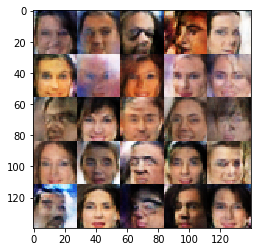

Epoch: 0/1      Batch: 5460      Discriminator Loss: 1.2440      Generator Loss: 0.8217     
Epoch: 0/1      Batch: 5470      Discriminator Loss: 1.1008      Generator Loss: 0.7777     
Epoch: 0/1      Batch: 5480      Discriminator Loss: 1.2414      Generator Loss: 0.8636     
Epoch: 0/1      Batch: 5490      Discriminator Loss: 1.3462      Generator Loss: 0.7301     
Epoch: 0/1      Batch: 5500      Discriminator Loss: 1.2551      Generator Loss: 0.8682     


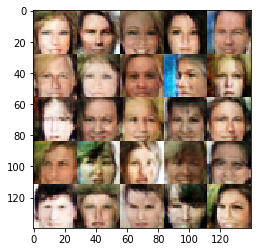

Epoch: 0/1      Batch: 5510      Discriminator Loss: 1.1995      Generator Loss: 0.9424     
Epoch: 0/1      Batch: 5520      Discriminator Loss: 1.2961      Generator Loss: 0.8539     
Epoch: 0/1      Batch: 5530      Discriminator Loss: 1.2693      Generator Loss: 0.7115     
Epoch: 0/1      Batch: 5540      Discriminator Loss: 1.1575      Generator Loss: 1.1754     
Epoch: 0/1      Batch: 5550      Discriminator Loss: 1.2268      Generator Loss: 0.8897     


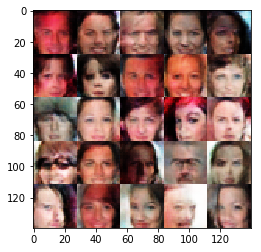

Epoch: 0/1      Batch: 5560      Discriminator Loss: 1.3181      Generator Loss: 1.1556     
Epoch: 0/1      Batch: 5570      Discriminator Loss: 1.3823      Generator Loss: 1.0740     
Epoch: 0/1      Batch: 5580      Discriminator Loss: 1.2775      Generator Loss: 0.9634     
Epoch: 0/1      Batch: 5590      Discriminator Loss: 1.3548      Generator Loss: 0.6782     
Epoch: 0/1      Batch: 5600      Discriminator Loss: 1.2159      Generator Loss: 0.7965     


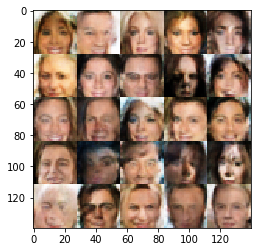

Epoch: 0/1      Batch: 5610      Discriminator Loss: 1.1830      Generator Loss: 0.9979     
Epoch: 0/1      Batch: 5620      Discriminator Loss: 1.1296      Generator Loss: 1.0581     
Epoch: 0/1      Batch: 5630      Discriminator Loss: 1.1449      Generator Loss: 0.9714     
Epoch: 0/1      Batch: 5640      Discriminator Loss: 1.3454      Generator Loss: 0.6339     
Epoch: 0/1      Batch: 5650      Discriminator Loss: 1.1564      Generator Loss: 0.7336     


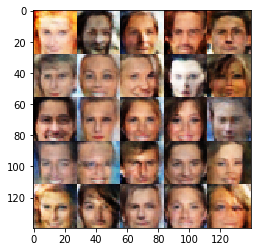

Epoch: 0/1      Batch: 5660      Discriminator Loss: 1.1258      Generator Loss: 0.9507     
Epoch: 0/1      Batch: 5670      Discriminator Loss: 1.1528      Generator Loss: 0.8283     
Epoch: 0/1      Batch: 5680      Discriminator Loss: 1.4251      Generator Loss: 1.0699     
Epoch: 0/1      Batch: 5690      Discriminator Loss: 1.1923      Generator Loss: 0.9095     
Epoch: 0/1      Batch: 5700      Discriminator Loss: 1.1057      Generator Loss: 1.0898     


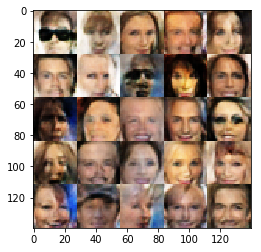

Epoch: 0/1      Batch: 5710      Discriminator Loss: 1.1965      Generator Loss: 1.1116     
Epoch: 0/1      Batch: 5720      Discriminator Loss: 1.1680      Generator Loss: 0.9496     
Epoch: 0/1      Batch: 5730      Discriminator Loss: 1.1174      Generator Loss: 0.7158     
Epoch: 0/1      Batch: 5740      Discriminator Loss: 1.2101      Generator Loss: 1.0733     
Epoch: 0/1      Batch: 5750      Discriminator Loss: 1.2794      Generator Loss: 0.7746     


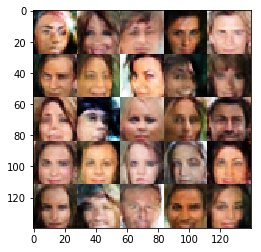

Epoch: 0/1      Batch: 5760      Discriminator Loss: 1.2292      Generator Loss: 1.1137     
Epoch: 0/1      Batch: 5770      Discriminator Loss: 1.2089      Generator Loss: 0.7698     
Epoch: 0/1      Batch: 5780      Discriminator Loss: 1.1791      Generator Loss: 0.9021     
Epoch: 0/1      Batch: 5790      Discriminator Loss: 1.5098      Generator Loss: 0.6399     
Epoch: 0/1      Batch: 5800      Discriminator Loss: 1.2257      Generator Loss: 1.2474     


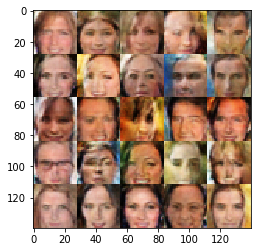

Epoch: 0/1      Batch: 5810      Discriminator Loss: 1.1374      Generator Loss: 0.8250     
Epoch: 0/1      Batch: 5820      Discriminator Loss: 1.3479      Generator Loss: 1.0282     
Epoch: 0/1      Batch: 5830      Discriminator Loss: 1.4208      Generator Loss: 0.6662     
Epoch: 0/1      Batch: 5840      Discriminator Loss: 1.2603      Generator Loss: 0.7776     
Epoch: 0/1      Batch: 5850      Discriminator Loss: 1.0292      Generator Loss: 1.1037     


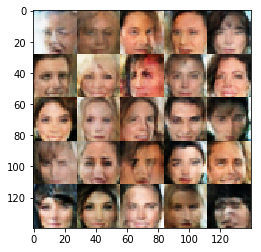

Epoch: 0/1      Batch: 5860      Discriminator Loss: 1.1435      Generator Loss: 1.0837     
Epoch: 0/1      Batch: 5870      Discriminator Loss: 1.2218      Generator Loss: 1.0679     
Epoch: 0/1      Batch: 5880      Discriminator Loss: 1.0903      Generator Loss: 1.1129     
Epoch: 0/1      Batch: 5890      Discriminator Loss: 1.2361      Generator Loss: 0.7251     
Epoch: 0/1      Batch: 5900      Discriminator Loss: 1.0735      Generator Loss: 0.9837     


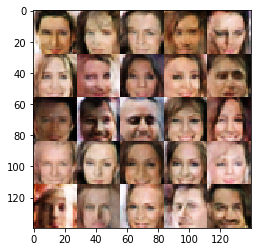

Epoch: 0/1      Batch: 5910      Discriminator Loss: 1.1773      Generator Loss: 0.8150     
Epoch: 0/1      Batch: 5920      Discriminator Loss: 1.2909      Generator Loss: 0.6165     
Epoch: 0/1      Batch: 5930      Discriminator Loss: 1.2751      Generator Loss: 0.9072     
Epoch: 0/1      Batch: 5940      Discriminator Loss: 1.1363      Generator Loss: 0.9068     
Epoch: 0/1      Batch: 5950      Discriminator Loss: 1.3123      Generator Loss: 0.8946     


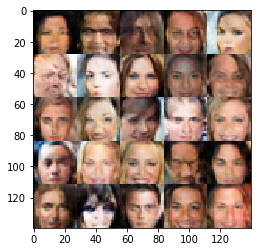

Epoch: 0/1      Batch: 5960      Discriminator Loss: 1.2635      Generator Loss: 0.9767     
Epoch: 0/1      Batch: 5970      Discriminator Loss: 1.3032      Generator Loss: 0.7762     
Epoch: 0/1      Batch: 5980      Discriminator Loss: 1.1948      Generator Loss: 0.7591     
Epoch: 0/1      Batch: 5990      Discriminator Loss: 1.4418      Generator Loss: 0.8899     
Epoch: 0/1      Batch: 6000      Discriminator Loss: 1.2071      Generator Loss: 1.0078     


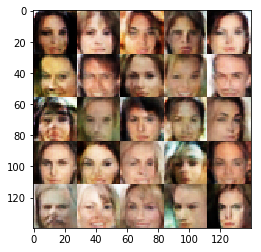

Epoch: 0/1      Batch: 6010      Discriminator Loss: 1.1263      Generator Loss: 1.0183     
Epoch: 0/1      Batch: 6020      Discriminator Loss: 1.2243      Generator Loss: 0.7390     
Epoch: 0/1      Batch: 6030      Discriminator Loss: 1.1753      Generator Loss: 0.7820     
Epoch: 0/1      Batch: 6040      Discriminator Loss: 1.0832      Generator Loss: 1.1607     
Epoch: 0/1      Batch: 6050      Discriminator Loss: 1.3236      Generator Loss: 0.6541     


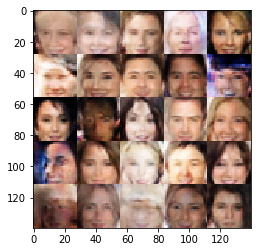

Epoch: 0/1      Batch: 6060      Discriminator Loss: 1.0937      Generator Loss: 1.0519     
Epoch: 0/1      Batch: 6070      Discriminator Loss: 1.0807      Generator Loss: 0.9012     
Epoch: 0/1      Batch: 6080      Discriminator Loss: 1.2702      Generator Loss: 0.8823     
Epoch: 0/1      Batch: 6090      Discriminator Loss: 1.2107      Generator Loss: 0.8312     
Epoch: 0/1      Batch: 6100      Discriminator Loss: 1.2705      Generator Loss: 0.9368     


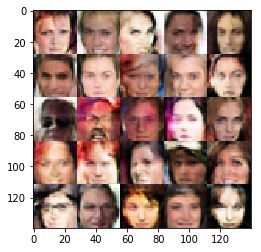

Epoch: 0/1      Batch: 6110      Discriminator Loss: 1.2268      Generator Loss: 0.6698     
Epoch: 0/1      Batch: 6120      Discriminator Loss: 1.1975      Generator Loss: 0.7620     
Epoch: 0/1      Batch: 6130      Discriminator Loss: 1.2196      Generator Loss: 1.0171     
Epoch: 0/1      Batch: 6140      Discriminator Loss: 1.1949      Generator Loss: 0.8096     
Epoch: 0/1      Batch: 6150      Discriminator Loss: 1.2977      Generator Loss: 0.6681     


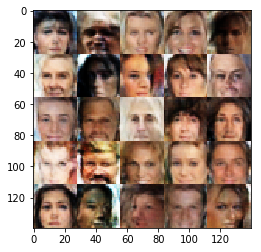

Epoch: 0/1      Batch: 6160      Discriminator Loss: 1.0630      Generator Loss: 1.0563     
Epoch: 0/1      Batch: 6170      Discriminator Loss: 1.2068      Generator Loss: 1.1923     
Epoch: 0/1      Batch: 6180      Discriminator Loss: 1.0831      Generator Loss: 0.9387     
Epoch: 0/1      Batch: 6190      Discriminator Loss: 1.0461      Generator Loss: 1.0596     
Epoch: 0/1      Batch: 6200      Discriminator Loss: 1.2491      Generator Loss: 0.7233     


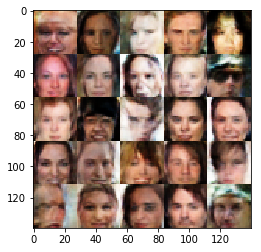

Epoch: 0/1      Batch: 6210      Discriminator Loss: 1.1569      Generator Loss: 0.8950     
Epoch: 0/1      Batch: 6220      Discriminator Loss: 1.2403      Generator Loss: 0.8781     
Epoch: 0/1      Batch: 6230      Discriminator Loss: 1.1830      Generator Loss: 0.9853     
Epoch: 0/1      Batch: 6240      Discriminator Loss: 0.8757      Generator Loss: 1.3509     
Epoch: 0/1      Batch: 6250      Discriminator Loss: 1.3940      Generator Loss: 0.6731     


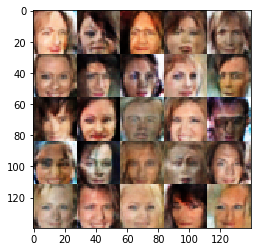

Epoch: 0/1      Batch: 6260      Discriminator Loss: 1.1828      Generator Loss: 0.9805     
Epoch: 0/1      Batch: 6270      Discriminator Loss: 1.3169      Generator Loss: 0.6939     
Epoch: 0/1      Batch: 6280      Discriminator Loss: 1.0403      Generator Loss: 0.9009     
Epoch: 0/1      Batch: 6290      Discriminator Loss: 1.1991      Generator Loss: 1.0346     
Epoch: 0/1      Batch: 6300      Discriminator Loss: 1.3376      Generator Loss: 0.8439     


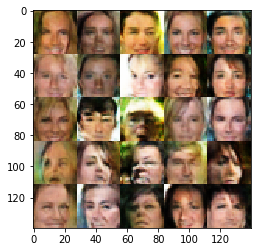

Epoch: 0/1      Batch: 6310      Discriminator Loss: 1.0620      Generator Loss: 0.8565     
Epoch: 0/1      Batch: 6320      Discriminator Loss: 1.2481      Generator Loss: 1.1327     
Epoch: 0/1      Batch: 6330      Discriminator Loss: 1.0615      Generator Loss: 1.0540     


In [ ]:
batch_size = 32
z_dim = 128
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.